In [5]:
!pip install pyscipopt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 85.5 MB/s eta 0:00:00


In [4]:
!pip install tensorly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 47.8 MB/s eta 0:00:00


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cv
from time import time

from utils import optimal_cpd_rank
from tSSA import t_SSA
from journal_style import EnableJournalStylePlotting

In [7]:
random_state = 42

In [8]:
def get_one_year_data(ts: pd.DataFrame, start: str, end: str):
    ts_year = ts[(start <= ts['Datetime']) & (ts['Datetime'] < end)]
    ts_year = ts_year.sort_values(['Datetime'], ascending=True)

    return ts_year

In [9]:
ts_aep = pd.read_csv("AEP_hourly.csv")

In [10]:
ts_2005_summer = get_one_year_data(ts_aep, '2005-06-01', '2005-09-01')
ts_2006_summer = get_one_year_data(ts_aep, '2006-06-01', '2006-09-01')
ts_2007_summer = get_one_year_data(ts_aep, '2007-06-01', '2007-09-01')

assert ts_2005_summer.shape == ts_2006_summer.shape == ts_2007_summer.shape

for i in range(ts_2005_summer.shape[0]):
    assert ts_2005_summer.iloc[i, 0][5:] == ts_2006_summer.iloc[i, 0][5:] == ts_2007_summer.iloc[i, 0][5:]

ts_2005_summer['Datetime'] = ts_2005_summer['Datetime'].str[5:]
ts_2006_summer['Datetime'] = ts_2006_summer['Datetime'].str[5:]
ts_2007_summer['Datetime'] = ts_2007_summer['Datetime'].str[5:]

ts_2005_summer.set_index(['Datetime'], inplace=True)
ts_2006_summer.set_index(['Datetime'], inplace=True)
ts_2007_summer.set_index(['Datetime'], inplace=True)

ts_2005_summer.rename(columns={'AEP_MW': 'AEP_MW_2005'}, inplace=True)
ts_2006_summer.rename(columns={'AEP_MW': 'AEP_MW_2006'}, inplace=True)
ts_2007_summer.rename(columns={'AEP_MW': 'AEP_MW_2007'}, inplace=True)

ts_multivariate = pd.concat([ts_2005_summer, ts_2006_summer, ts_2007_summer], axis=1)

In [11]:
ts_multivariate

,AEP_MW_2005,AEP_MW_2006,AEP_MW_2007
Datetime,,,
06-01 00:00:00,13723.0,16409.0,16421.0
06-01 01:00:00,12560.0,15092.0,15252.0
06-01 02:00:00,12118.0,14367.0,14435.0
06-01 03:00:00,11684.0,13868.0,13891.0
06-01 04:00:00,11350.0,13543.0,13677.0
...,...,...,...
08-31 19:00:00,18533.0,16668.0,18588.0
08-31 20:00:00,18009.0,16660.0,17793.0
08-31 21:00:00,18152.0,17233.0,17648.0


In [12]:
ts_train = ts_multivariate.iloc[:ts_multivariate.shape[0] - 250, :]
ts_test = ts_multivariate.iloc[ts_multivariate.shape[0] - 250:, :]

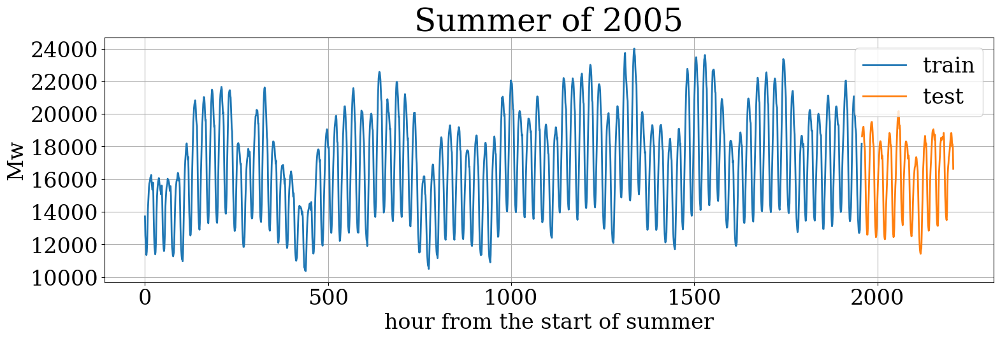

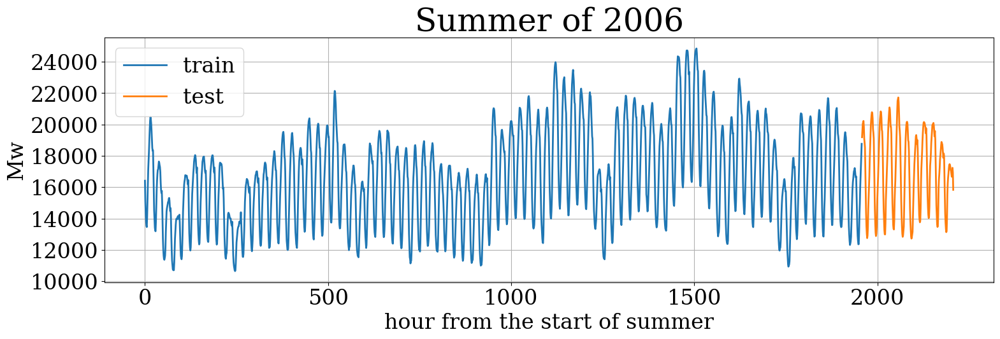

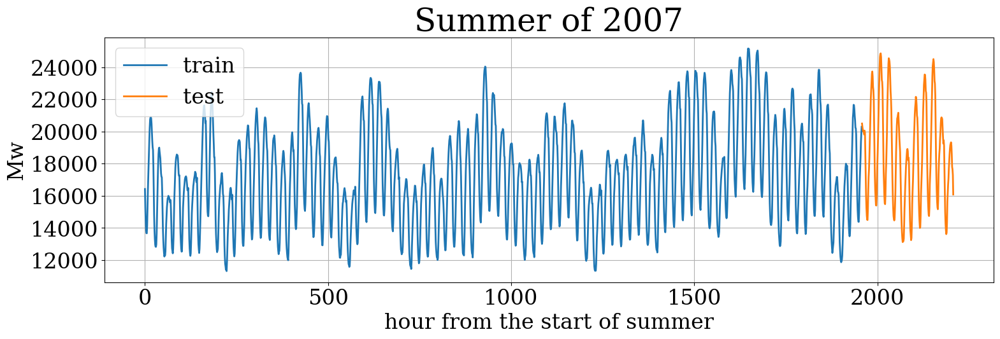

In [ ]:
for i in range(ts_multivariate.shape[1]):
    with EnableJournalStylePlotting():
        figure, ax = plt.subplots(figsize=(18, 5))

        ax.plot(ts_train.iloc[:, i].to_numpy(), label=f'train')
        ax.plot(np.arange(ts_train.shape[0], ts_multivariate.shape[0], 1), ts_test.iloc[:, i].to_numpy(), label=f'test')
        ax.grid()
        ax.set_title(f'Summer of 200{5 + i}')
        ax.set_xlabel('hour from the start of summer')
        ax.set_ylabel('Mw')
        plt.legend()

In [38]:
# names of observed signals
sig_names = ['AEP Summer 2005', 'AEP Summer 2006', 'AEP Summer 2007']
# measure units
sig_units = ['MhW', 'MhW', 'MhW']

color_list = ['#7F27FF', '#FF8911', '#65B741']

# Выполнение прогноза с помощью tSSA

Для начала разделим выделим из train валидационную выборку и с помощью перебора по сетке выберем оптимальный ранг CP-разложения.

In [13]:
ts_train_np = ts_train.to_numpy()
ts_test_np = ts_test.to_numpy()

ts_train_cut_np = ts_train_np[:ts_train_np.shape[0] - 250, :]
ts_val = ts_train_np[ts_train_np.shape[0] - 250:, :] # валидационная

In [14]:
w_size = 150 # размерность вложения

In [ ]:
cpd_rank_result, cpd_errors, mape_forecast = optimal_cpd_rank(ts_train_cut_np,
                                   ts_val, w_size)

CP rank = 5
CPD-error = 0.08251439484023941
MSE: [2.85518942e+07 1.46689013e+07 1.17763575e+08]; Mean by signals = 5.366146e+07
MAPE: [0.25024705 0.1897823  0.47574918]; Mean by signals = 3.052595e-01
CP rank = 10
CPD-error = 0.056075042798735396
MSE: [1212019.13028676 1725861.09913274 7705922.31800349]; Mean by signals = 3.547934e+06
MAPE: [0.0521737  0.06486207 0.13644474]; Mean by signals = 8.449350e-02
CP rank = 15
CPD-error = 0.040370047321414214
MSE: [11980327.54684076  4464200.86080177  5345007.43007838]; Mean by signals = 7.263179e+06
MAPE: [0.17194373 0.10189527 0.10737512]; Mean by signals = 1.270714e-01
CP rank = 20
CPD-error = 0.03520930992734257
MSE: [3.42412552e+07 6.49945340e+08 5.90466924e+08]; Mean by signals = 4.248845e+08
MAPE: [0.23275936 1.264748   1.18799054]; Mean by signals = 8.951660e-01
CP rank = 25
CPD-error = 0.030489942479333714
MSE: [17501155.36842647 13256391.28795628  7654442.32304683]; Mean by signals = 1.280400e+07
MAPE: [0.19948462 0.17688699 0.129004

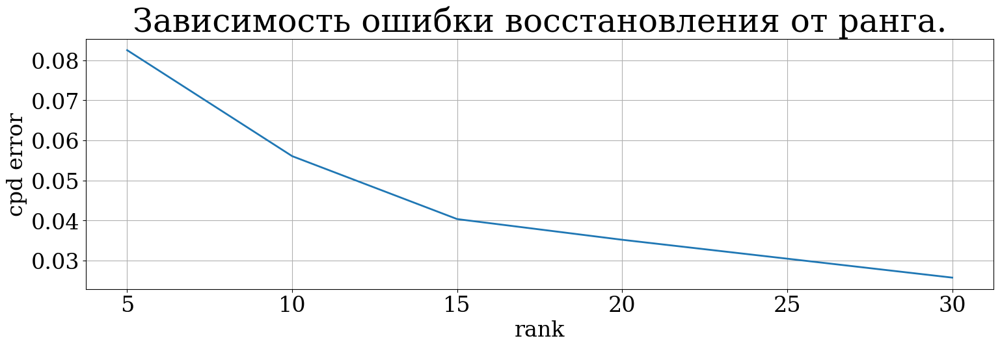

In [ ]:
with EnableJournalStylePlotting():
    figure, ax = plt.subplots(figsize=(18, 5))

    ax.plot(np.arange(5, 30 + 1, 5), cpd_errors)
    ax.grid()
    ax.set_title(f'Зависимость ошибки восстановления от ранга.')
    ax.set_xlabel('rank')
    ax.set_ylabel('cpd error')

Логично, что чем больше ранг, тем меньше ошибка восстановления.

Теперь посмотрим на зависимость ошибки прогноза от ранга CP-разложения. Выберем ранг, соответствующий наилучшему прогнозу.

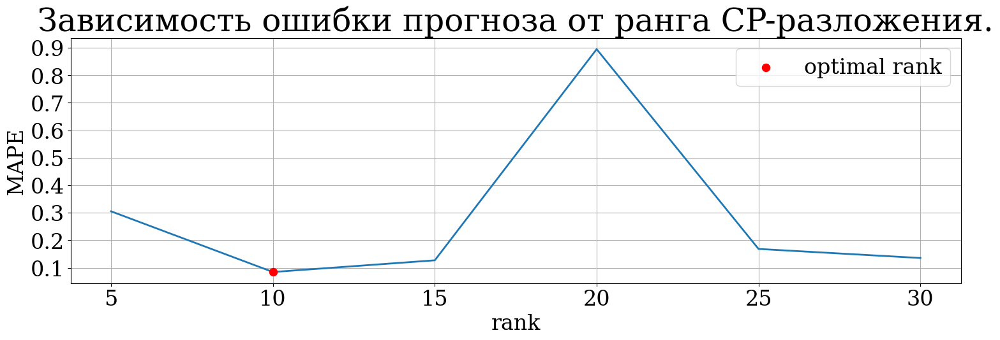

In [ ]:
with EnableJournalStylePlotting():
    figure, ax = plt.subplots(figsize=(18, 5))

    ax.plot(np.arange(5, 30 + 1, 5), mape_forecast)
    ax.grid()
    ax.scatter([10], [mape_forecast[1]], marker=".", s=300, c="red", label="optimal rank", zorder=10)
    ax.set_title(f'Зависимость ошибки прогноза от ранга CP-разложения.')
    ax.set_xlabel('rank')
    ax.set_ylabel('MAPE')
    plt.legend()

Как видим, оптимальный ранг - 10. Используя его, сделаем прогноз и визуализируем его на тестовой выборке.

In [15]:
optimal_rank = 10
tSSA_obj = t_SSA(w_size, ts_train_np.T, optimal_rank)
tSSA_obj.decompose_tt(random_state=random_state)

In [20]:
def get_diag_matrix(x):
    X = np.zeros((x.shape[0], x.shape[0]))
    for i in range(x.shape[0]):
        X[i, i] = x[i]

    return X

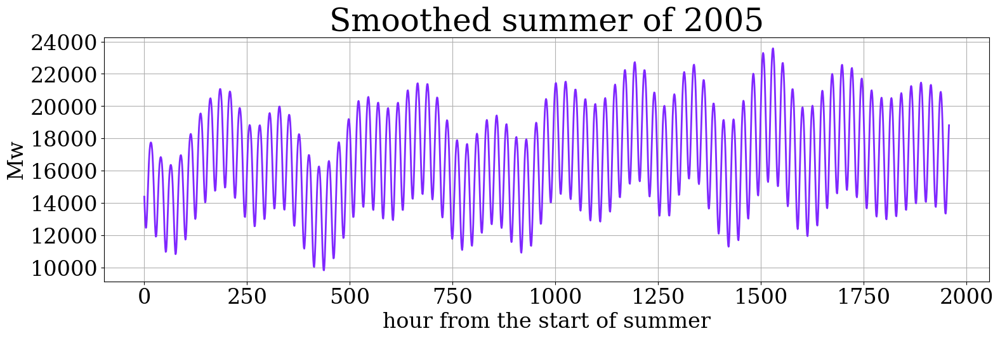

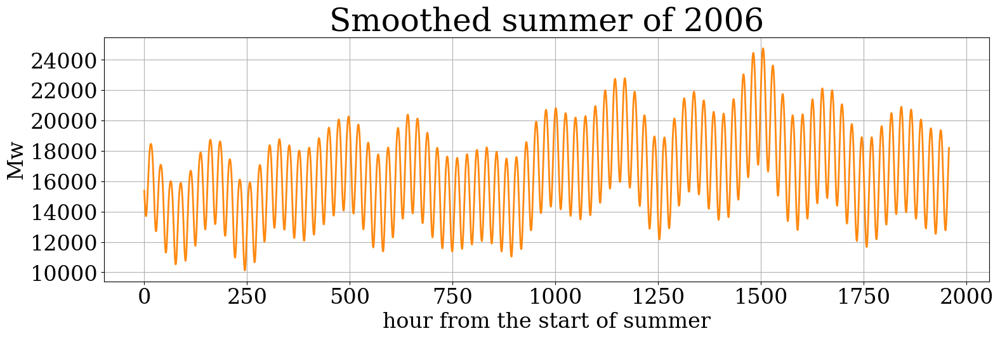

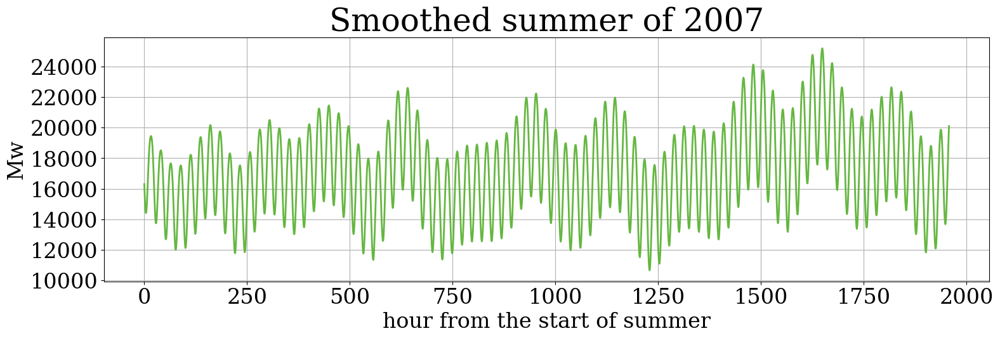

In [39]:
for i in range(ts_train_np.shape[1]):
    weights, left_factors, right_factors = tSSA_obj.get_available_factors(i)
    weights = get_diag_matrix(weights)
    trajectory_matrix = (left_factors @ weights) @ right_factors
    tSSA_obj._hankelize_matrix(trajectory_matrix)

    smoothed_ts = np.array(list(trajectory_matrix[0, :]) + list(trajectory_matrix[1:, -1]))

    with EnableJournalStylePlotting():
        figure, ax = plt.subplots(figsize=(18, 5))

        ax.plot(smoothed_ts, color=color_list[i])
        ax.grid()
        ax.set_title(f'Smoothed summer of 200{5 + i}')
        ax.set_xlabel('hour from the start of summer')
        ax.set_ylabel('Mw')

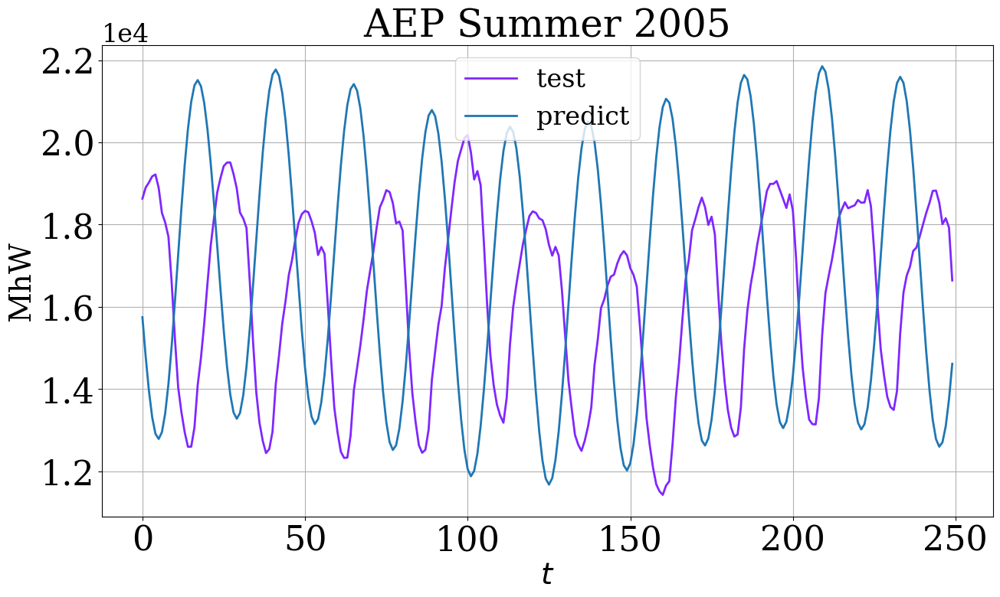

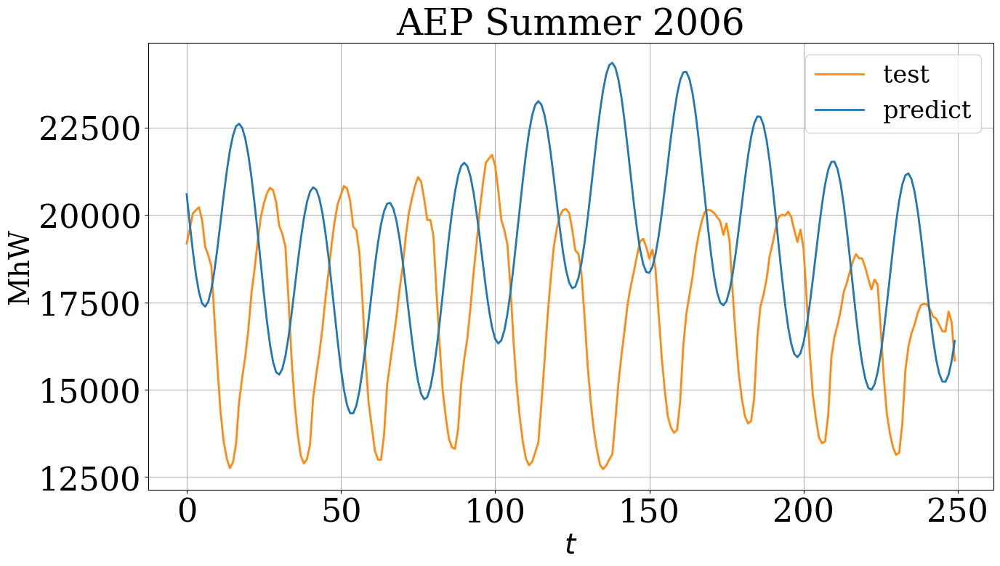

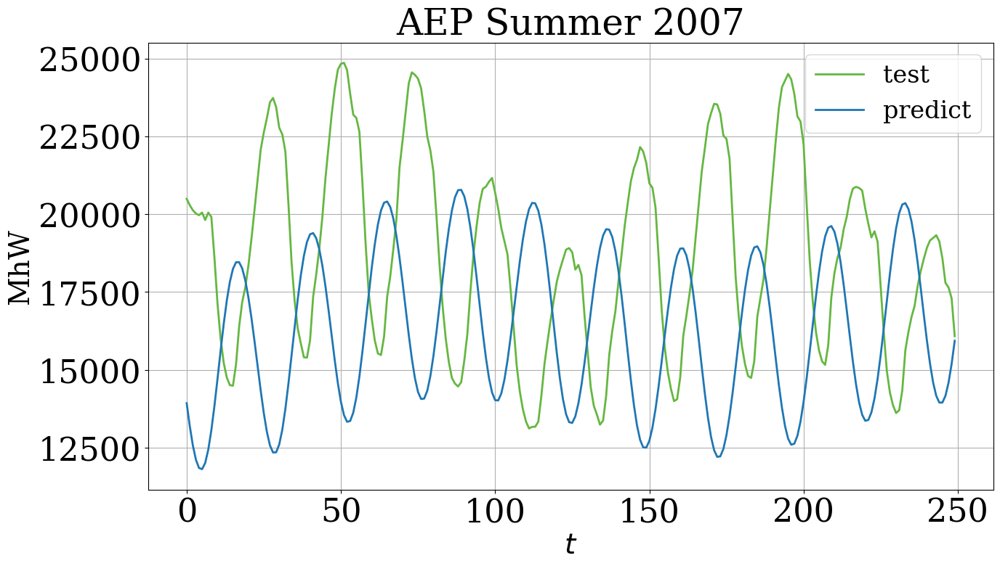

In [ ]:
# get prediction for cuurent number of factors left
forecast_tssa = np.empty(ts_test_np.shape)

for i in range(ts_test_np.shape[0]):
    forecast_tssa[i] = np.array(tSSA_obj.predict_next())

for i in range(ts_test_np.shape[1]):
    with EnableJournalStylePlotting():
        fig, ax = plt.subplots(figsize=(15, 8))

        ax.plot(ts_test_np.T[i], color=color_list[i], label='test')
        ax.plot(forecast_tssa.T[i], label='predict')

        ax.grid(True)
        ax.legend();
        ax.set_ylabel(f'{sig_units[i]}', fontsize=28)
        ax.set_xlabel('$t$', fontsize=28)
        ax.set_title(f'{sig_names[i]}')

        ax.tick_params(axis='x', labelsize=32)
        ax.tick_params(axis='y', labelsize=32)
        if i == 0:
            ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

In [ ]:
mape_forecast = [(np.abs(ts_test_np.T[i] - forecast_tssa.T[i]) / np.abs(ts_test_np.T[i])).mean() for i in range(ts_test_np.shape[1])]

In [ ]:
for err in mape_forecast:
    print(f'for Summer 200{5 + i}: MAPE = {err}')

print(f'Average MAPE = {np.mean(mape_forecast)}')

for Summer 2007: MAPE = 0.29196591216558954
for Summer 2007: MAPE = 0.25884459222844475
for Summer 2007: MAPE = 0.2529682577102684
Average MAPE = 0.26792625403476755


# Декомпозиция рядов с помощью tSSA

In [ ]:
num_signals = 3

cpd_ranks = np.arange(5, 50 + 1, 5)
# container for RHE metrics
RHE_results = {}

group_results = {}

# cut the size of the ILS system
max_col_size = 500

CPD-rank = 5
Signal 0
solve time 6.2987518310546875
status: optimal
optimal value 280891.1601113666
optimal beta [1. 0. 0. 1.]
Signal 1
solve time 4.81283974647522
status: optimal
optimal value 316087.8785919871
optimal beta [1. 0. 0. 1.]
Signal 2
solve time 6.5361106395721436
status: optimal
optimal value 270307.3745066511
optimal beta [1. 0. 0. 1.]
RHE for AEP Summer 2005: [0.77577794 0.81222716]; Mean_ts_RHE = 0.7940025475223351
RHE for AEP Summer 2006: [0.83624661 0.83556656]; Mean_ts_RHE = 0.8359065830714091
RHE for AEP Summer 2007: [0.73317739 0.80340719]; Mean_ts_RHE = 0.7682922865054258
Mean RHE for data = 0.79940047236639


CPD-rank = 10
Signal 0
solve time 18.070341110229492
status: optimal
optimal value 227663.8850540496
optimal beta [-0. -0.  1.  1.  0.  0.  0.  0.  0.]
Signal 1
solve time 10.143184423446655
status: optimal
optimal value 195516.9834699834
optimal beta [1. 0. 1. 0. 0. 0. 0. 0. 0.]
Signal 2
solve time 16.427798986434937
status: optimal
optimal value 128581.46

<ipython-input-14-1e223af16c8f>:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=len(comp_sigs[i]), ncols=1, figsize=(15, 8))


Signal 0
solve time 44.29286789894104
status: optimal
optimal value 3421.604012651702
optimal beta [ 0.  0.  0.  0.  0.  0.  0.  0. -0. -0.  0.  0. -0.  0.  0.  1.  0. -0.
 -0.  1.  0. -0. -0. -0.  0.  1.  0.  0.  0. -0.  0.  0.  0.  0.  0.  0.
  0. -0.  0.]
Signal 1
solve time 70.52608919143677
status: optimal
optimal value 3170.013674528303
optimal beta [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Signal 2
solve time 106.39001059532166
status: optimal
optimal value 4346.806013750776
optimal beta [0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
RHE for AEP Summer 2005: [0.98578133 0.01431898]; Mean_ts_RHE = 0.5000501541527637
RHE for AEP Summer 2006: [0.98581114 0.01762645]; Mean_ts_RHE = 0.5017187943506608
RHE for AEP Summer 2007: [0.98609761 0.02491409]; Mean_ts_RHE = 0.5055058508413961
Mean RHE for data = 0.5024249331149402


CPD-rank = 4

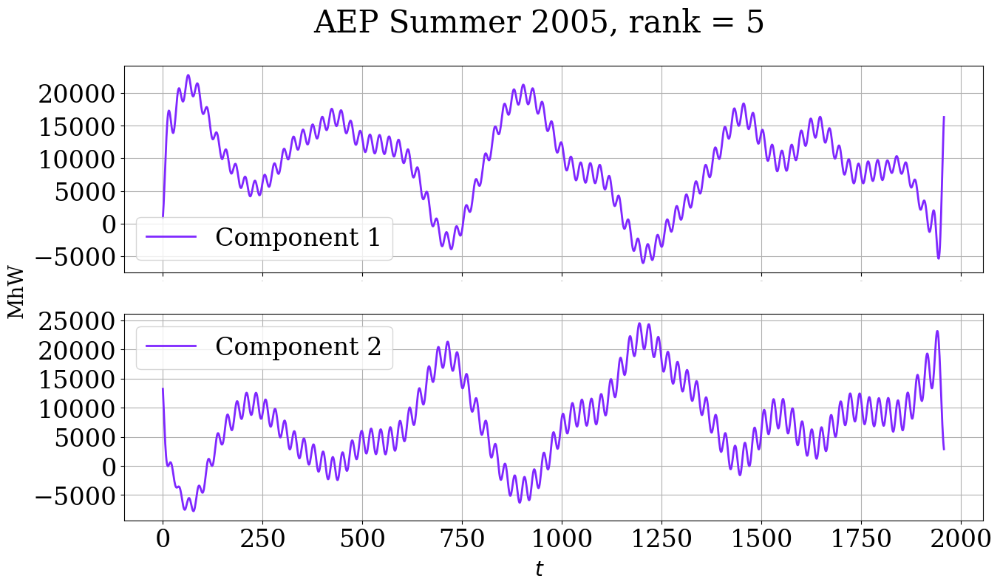

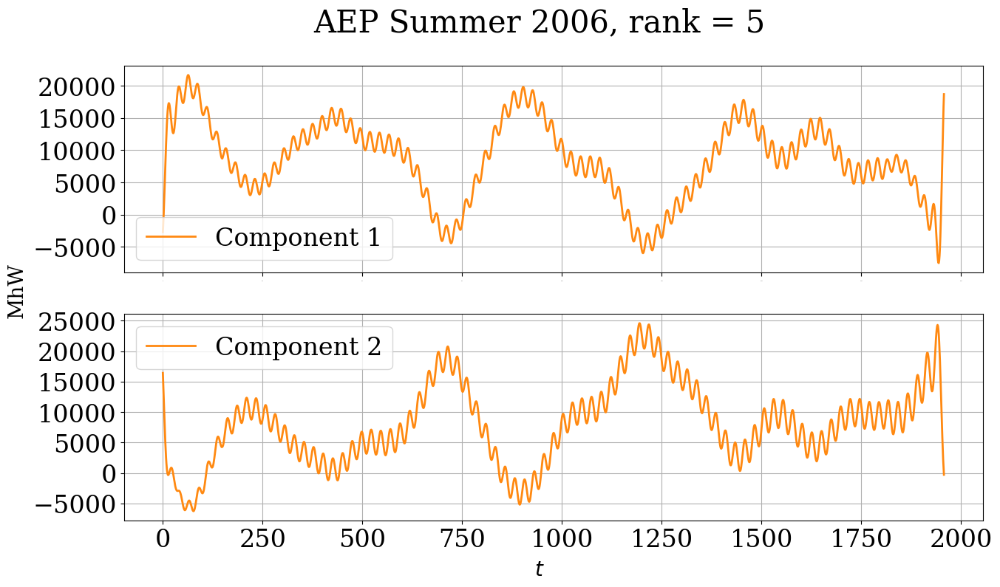

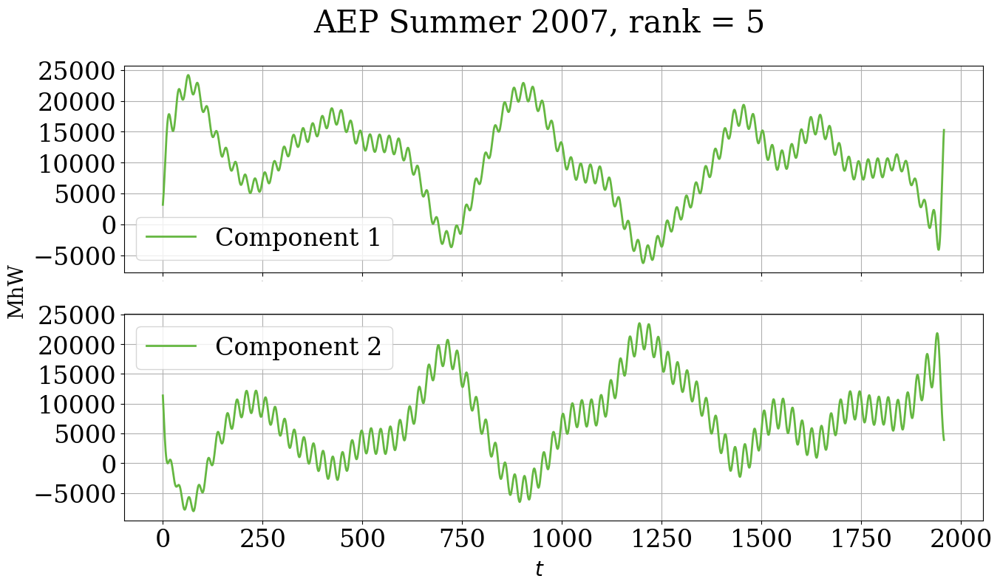

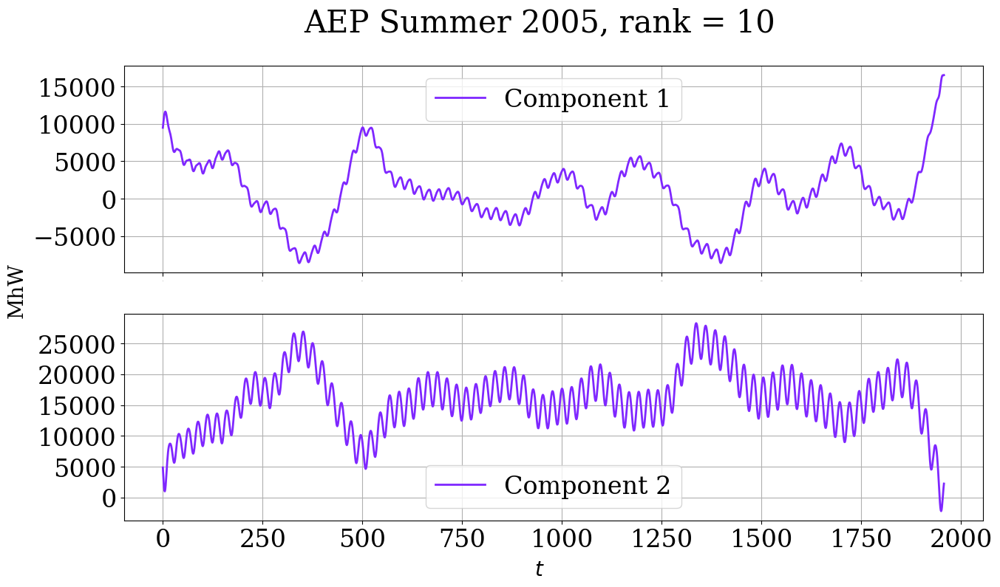

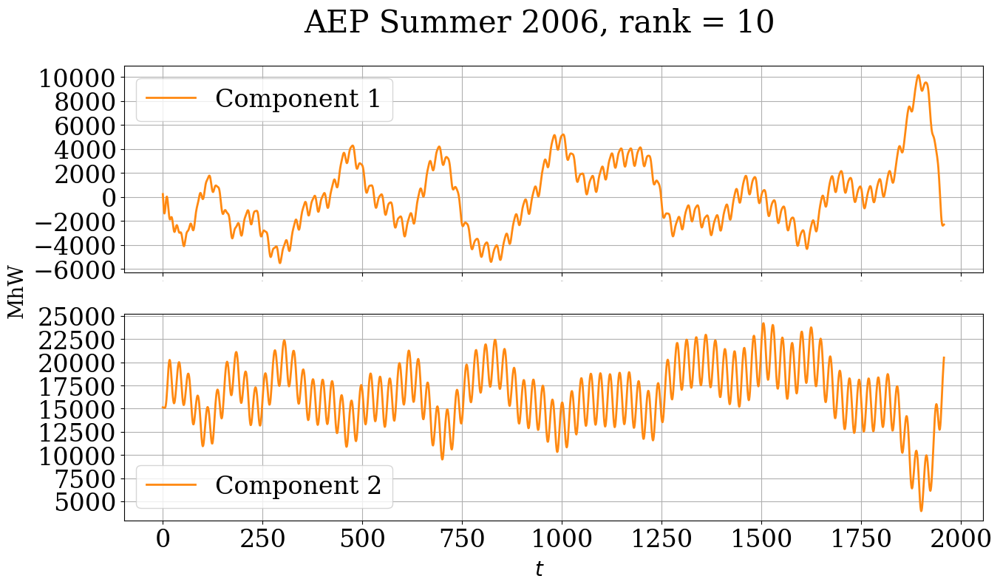

...

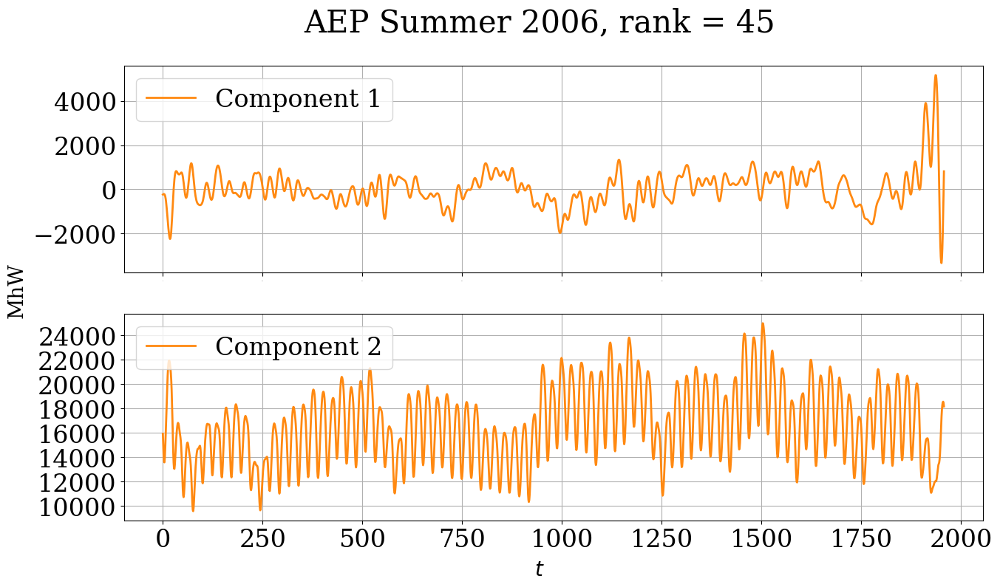

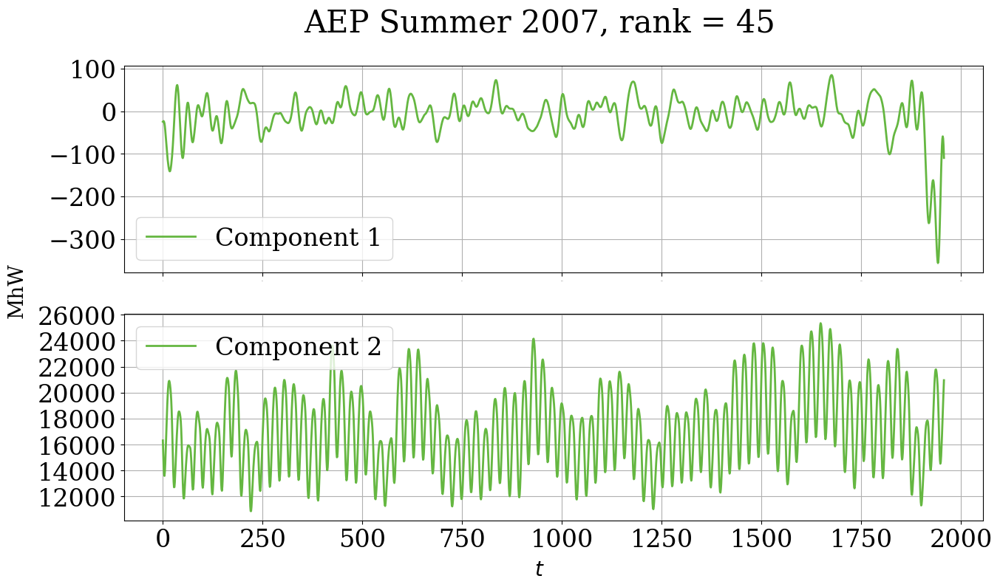

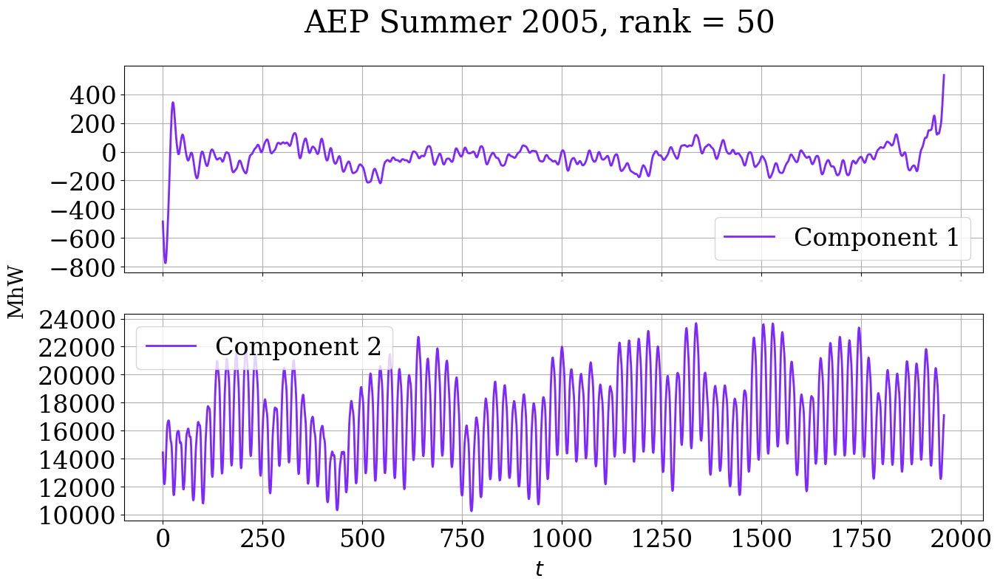

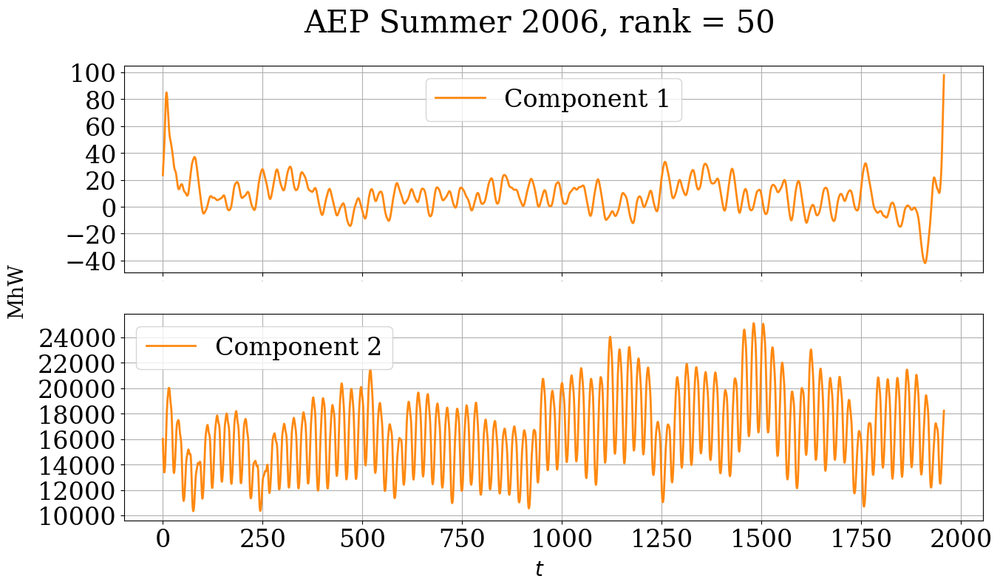

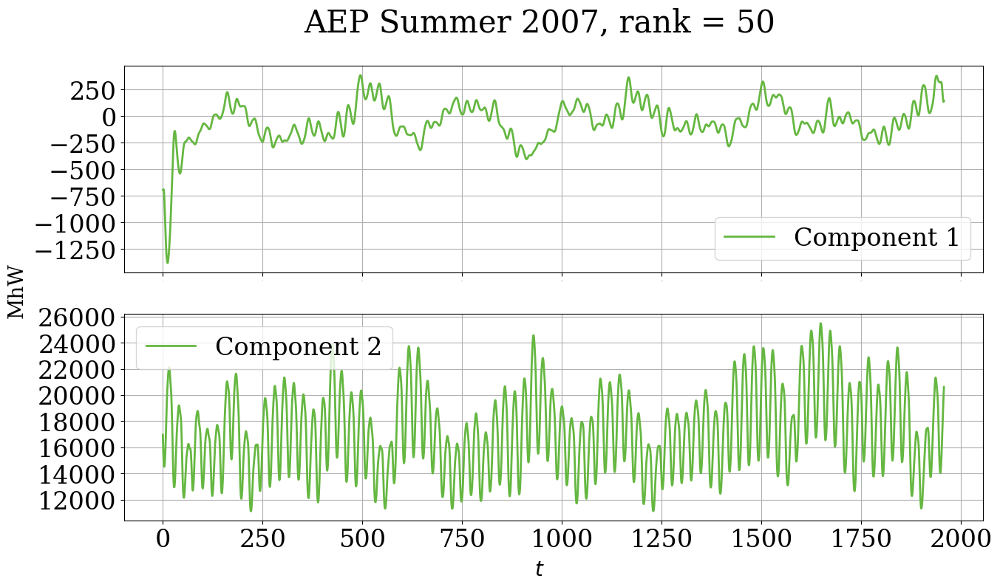

In [ ]:
for cpd_rank in cpd_ranks:
    print(f"CPD-rank = {cpd_rank}")

    t_ssa = t_SSA(w_size, ts_train_np.T, cpd_rank)
    t_ssa.decompose_tt(random_state=random_state)

    group_results[cpd_rank] = []

    num_signals = len(t_ssa.t_s_list)
    for sig_num in range(num_signals):
        print(f"Signal {sig_num}")

        column_list = []

        weights, left_factors, right_factors = t_ssa.get_available_factors(sig_num)

        # construct ILS system
        # get all factors except last
        for i in range(weights.shape[0] - 1):
            # compute residual matrix and cut its size
            factor_matrix = weights[i] * np.outer(left_factors[:, i], right_factors[i, :])
            hankelized_factor = factor_matrix.copy(); t_ssa._hankelize_matrix(hankelized_factor)
            resid_matrix = factor_matrix - hankelized_factor

            column_list.append(
                resid_matrix.reshape(-1, 1)[:max_col_size]
            )

        ils_matrix = np.concatenate(column_list, axis=1)

        # CVXPY problem statement
        beta = cv.Variable(ils_matrix.shape[1], boolean=True)
        constraint = [cv.sum(beta) >= 2]
        obj = cv.Minimize(cv.norm(ils_matrix @ beta))
        problem = cv.Problem(obj, constraint)

        solve_time = time()
        problem.solve(solver="SCIP")
        solve_time = time() - solve_time

        print("solve time", solve_time)
        print("status:", problem.status)
        print("optimal value", problem.value)
        print("optimal beta", np.round(beta.value))

        # setting factors
        beta.value = np.round(beta.value).astype(np.int32)
        group_1 = np.argwhere(beta.value).flatten().tolist()
        group_2 = list(set(range(cpd_rank)) - set(group_1))

        group_results[cpd_rank].append([group_1, group_2])

        t_ssa.set_factors_grouping([group_1, group_2], sig_num)

    # compute decomposition
    comp_sigs, hank_resid_abs, hank_resid_rel = t_ssa.decompose_signals()

    RHE_results.update({
        cpd_rank: hank_resid_rel
    })

    # view and save relative hankerlization errors
    for i in range(ts_train_np.shape[1]):
        print(f'RHE for {sig_names[i]}: {hank_resid_rel[i]}; Mean_ts_RHE = {np.mean(hank_resid_rel[i])}')
    print(f"Mean RHE for data = {np.mean(np.array(RHE_results[cpd_rank]))}")

    # plot results
    for i in range(ts_train_np.shape[1]):
        with EnableJournalStylePlotting():
            fig, axs = plt.subplots(nrows=len(comp_sigs[i]), ncols=1, figsize=(15, 8))

            for j in range(len(comp_sigs[i])):
                axs[j].plot(comp_sigs[i][j], label=f'Component {j + 1}', color=color_list[i])

                if j != len(comp_sigs[i]) - 1:
                    axs[j].tick_params(axis='x', labelsize=0)

                axs[j].grid(True)
                axs[j].legend()

            fig.supylabel(f'{sig_units[i]}', fontsize=20)
            fig.supxlabel('$t$', fontsize=20)
            fig.suptitle(f'{sig_names[i]}, rank = {cpd_rank}', fontsize=30)

    print("\n")

Наименьшая ошибка ганкелезации - при ранге 45.